In [103]:
#imports
import pandas as pd
import json
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
import matplotlib.pyplot as plt
import ast
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/bokchoe/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [104]:
df = pd.read_csv('location_output_WITH_LONG_LATS_AND_COUNTY.csv')

In [105]:
df.head(3)

,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,position_section,position_subsection,hl1,hl2,author,lede,body,...,indexing_terms,year,actual_body_word_count,body_cleaned,llama_pred,span_NER_pred,NER_Filtered,TRACT_LIST,COUNTY_LIST,LONG_LAT
0,0,0,0,LIVING ARTS,unknown,greater boston author readings nov. 13-19,unknown,unknown,"sunday katrina kenison (""moments of seeing: re...","monday john simpson (""the word detective: sear...",...,"{'subject': [{'score': '90', 'classCode': 'ST0...",2016,359,monday john simpson ( `` word detective : sear...,Based on the information provided in the hea...,"[(Boston, 'GPE'), (Massachusetts, 'GPE'), (1, ...","[('Fenway', 'LOC')]",['010403'],['025'],"[-71.08902, 42.34639]"
1,1,1,1,SPORTS,unknown,tough time breaking the ice,bc has only all-female staff in division 1 hockey,unknown,the boston college women's hockey team takes t...,it's unacceptable that women's college hockey ...,...,"{'subject': [{'score': '90', 'classCode': 'STX...",2016,1002,' unacceptable women ' college hockey ' boast ...,Based on the information provided in the art...,"[(Boston, 'GPE'), (Allston, 'LOC'), (1, 'CARDI...","[('Harvard Avenue', 'FAC'), ('Brighton Avenue'...",['091900'],['025'],"[-71.0752433333333, 42.29987]"
2,2,2,2,MAGAZINE,unknown,top 5 places new englanders like to go in winter,our favorite destinations aren't all warm — pl...,By Marisa Dellatto,> $141.17 — average cost of a night in a mass....,> 25 degrees — average temperature across new ...,...,"{'subject': [{'score': '91', 'classCode': 'ST0...",2016,176,25 degrees average temperature across new engl...,Based on the information provided in the art...,"[(1, 'CARDINAL'), (Boston, 'GPE'), (Massachuse...","[('The North End', 'LOC')]",[],['NO COUNTY'],"[-73.1629703333333, 41.1946496666667]"


In [106]:
indexes = df['indexing_terms']
df['keywords'] = 'unknown'

for index in range(len(indexes)):
    try:
        keywords = ""
        x = indexes[index].replace("'", "\"")
        res = json.loads(x)
        first_key = list(res.keys())[0]
        subjects = res[first_key]
        for subject in subjects:
            keyword = subject['className']
            keywords += keyword + " "
        df.at[index, 'keywords'] = keywords
    except:
        print(index)

20
34
35
39
50
88
89
116
187
195
209
243
245
295
297
308
320
321
337
362
370
387
389
490
515
516
528
539
550
569
611
623
639
646
653
662
680
709
765
769
795
814
820
823
864
889
905
914
916
971
974
990
995
996
1010
1012
1014
1050
1064
1098
1116
1119
1163
1168
1186
1201
1211
1221
1225
1236
1252
1260
1267
1289
1360
1403
1410


In [107]:
df.head()

,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,position_section,position_subsection,hl1,hl2,author,lede,body,...,year,actual_body_word_count,body_cleaned,llama_pred,span_NER_pred,NER_Filtered,TRACT_LIST,COUNTY_LIST,LONG_LAT,keywords
0,0,0,0,LIVING ARTS,unknown,greater boston author readings nov. 13-19,unknown,unknown,"sunday katrina kenison (""moments of seeing: re...","monday john simpson (""the word detective: sear...",...,2016,359,monday john simpson ( `` word detective : sear...,Based on the information provided in the hea...,"[(Boston, 'GPE'), (Massachusetts, 'GPE'), (1, ...","[('Fenway', 'LOC')]",['010403'],['025'],"[-71.08902, 42.34639]",LITERATURE WRITERS BOOKSTORES POP & ROCK SUPRE...
1,1,1,1,SPORTS,unknown,tough time breaking the ice,bc has only all-female staff in division 1 hockey,unknown,the boston college women's hockey team takes t...,it's unacceptable that women's college hockey ...,...,2016,1002,' unacceptable women ' college hockey ' boast ...,Based on the information provided in the art...,"[(Boston, 'GPE'), (Allston, 'LOC'), (1, 'CARDI...","[('Harvard Avenue', 'FAC'), ('Brighton Avenue'...",['091900'],['025'],"[-71.0752433333333, 42.29987]",COLLEGE & UNIVERSITY SPORTS WINTER SPORTS RANK...
2,2,2,2,MAGAZINE,unknown,top 5 places new englanders like to go in winter,our favorite destinations aren't all warm — pl...,By Marisa Dellatto,> $141.17 — average cost of a night in a mass....,> 25 degrees — average temperature across new ...,...,2016,176,25 degrees average temperature across new engl...,Based on the information provided in the art...,"[(1, 'CARDINAL'), (Boston, 'GPE'), (Massachuse...","[('The North End', 'LOC')]",[],['NO COUNTY'],"[-73.1629703333333, 41.1946496666667]",DESTINATIONS & ATTRACTIONS HOTELS & MOTELS CON...
3,3,3,3,SUNDAY,Travel,home design with art in mind,unknown,unknown,the restored sunken garden at hill-stead in fa...,"hill-stead, pope's 33,000-square-foot colonial...",...,2016,794,"hill- stead , pope ' 33 , 000- square- foot co...",Based on the information provided in the art...,"[(Boston, 'GPE'), (Massachusetts, 'GPE'), (1, ...","[('South End', 'LOC')]",['070700'],['025'],"[-71.078194, 42.344623]",MUSEUMS & GALLERIES ART COLLECTING ARCHITECTUR...
4,4,4,4,NEWS,Metro,at least the hens won,unknown,unknown,"well, i'm happy for the chickens. since tuesda...",earlier this year i went to visit the country ...,...,2016,562,earlier year went visit country hen hubbardsto...,Based on the information provided in the art...,"[(1, 'CARDINAL'), (Boston, 'GPE'), (2, 'CARDIN...","[('Fenway Park', 'FAC'), ('Boston Red Sox', 'O...",['010206'],['025'],"[-71.0975175, 42.3463355]",US PRESIDENTIAL CANDIDATES 2016 US PRESIDENTIA...


In [108]:
df = df.drop(columns=['Unnamed: 0.2', 'Unnamed: 0.1', 'Unnamed: 0'])
df.head()

,position_section,position_subsection,hl1,hl2,author,lede,body,pub_date,indexing_terms,year,actual_body_word_count,body_cleaned,llama_pred,span_NER_pred,NER_Filtered,TRACT_LIST,COUNTY_LIST,LONG_LAT,keywords
0,LIVING ARTS,unknown,greater boston author readings nov. 13-19,unknown,unknown,"sunday katrina kenison (""moments of seeing: re...","monday john simpson (""the word detective: sear...",2016-11-13,"{'subject': [{'score': '90', 'classCode': 'ST0...",2016,359,monday john simpson ( `` word detective : sear...,Based on the information provided in the hea...,"[(Boston, 'GPE'), (Massachusetts, 'GPE'), (1, ...","[('Fenway', 'LOC')]",['010403'],['025'],"[-71.08902, 42.34639]",LITERATURE WRITERS BOOKSTORES POP & ROCK SUPRE...
1,SPORTS,unknown,tough time breaking the ice,bc has only all-female staff in division 1 hockey,unknown,the boston college women's hockey team takes t...,it's unacceptable that women's college hockey ...,2016-11-13,"{'subject': [{'score': '90', 'classCode': 'STX...",2016,1002,' unacceptable women ' college hockey ' boast ...,Based on the information provided in the art...,"[(Boston, 'GPE'), (Allston, 'LOC'), (1, 'CARDI...","[('Harvard Avenue', 'FAC'), ('Brighton Avenue'...",['091900'],['025'],"[-71.0752433333333, 42.29987]",COLLEGE & UNIVERSITY SPORTS WINTER SPORTS RANK...
2,MAGAZINE,unknown,top 5 places new englanders like to go in winter,our favorite destinations aren't all warm — pl...,By Marisa Dellatto,> $141.17 — average cost of a night in a mass....,> 25 degrees — average temperature across new ...,2016-11-13,"{'subject': [{'score': '91', 'classCode': 'ST0...",2016,176,25 degrees average temperature across new engl...,Based on the information provided in the art...,"[(1, 'CARDINAL'), (Boston, 'GPE'), (Massachuse...","[('The North End', 'LOC')]",[],['NO COUNTY'],"[-73.1629703333333, 41.1946496666667]",DESTINATIONS & ATTRACTIONS HOTELS & MOTELS CON...
3,SUNDAY,Travel,home design with art in mind,unknown,unknown,the restored sunken garden at hill-stead in fa...,"hill-stead, pope's 33,000-square-foot colonial...",2016-11-13,"{'subject': [{'score': '90', 'classCode': 'N71...",2016,794,"hill- stead , pope ' 33 , 000- square- foot co...",Based on the information provided in the art...,"[(Boston, 'GPE'), (Massachusetts, 'GPE'), (1, ...","[('South End', 'LOC')]",['070700'],['025'],"[-71.078194, 42.344623]",MUSEUMS & GALLERIES ART COLLECTING ARCHITECTUR...
4,NEWS,Metro,at least the hens won,unknown,unknown,"well, i'm happy for the chickens. since tuesda...",earlier this year i went to visit the country ...,2016-11-13,"{'subject': [{'score': '90', 'classCode': 'ST0...",2016,562,earlier year went visit country hen hubbardsto...,Based on the information provided in the art...,"[(1, 'CARDINAL'), (Boston, 'GPE'), (2, 'CARDIN...","[('Fenway Park', 'FAC'), ('Boston Red Sox', 'O...",['010206'],['025'],"[-71.0975175, 42.3463355]",US PRESIDENTIAL CANDIDATES 2016 US PRESIDENTIA...


In [109]:
df.shape

(1434, 19)

In [110]:
# function to calculate sentiment score
sia = SentimentIntensityAnalyzer()
def get_sentiment_score(text):
    if pd.isna(text):
        return "unknown"
    else:
        return sia.polarity_scores(text)['compound']
# keyword sentiment
df['keyword_sentiment'] = 'unknown'
for index in range(len(df)):
    keyword = df.at[index, 'keywords']
    sentiment = get_sentiment_score(keyword)
    df.at[index, 'keyword_sentiment'] = sentiment
# hl1 sentiment
df['hl1_sentiment'] = df['hl1'].apply(get_sentiment_score)
# body sentiment
df['body_sentiment'] = df['body_cleaned'].apply(get_sentiment_score)

In [111]:
df.head(3)

,position_section,position_subsection,hl1,hl2,author,lede,body,pub_date,indexing_terms,year,...,llama_pred,span_NER_pred,NER_Filtered,TRACT_LIST,COUNTY_LIST,LONG_LAT,keywords,keyword_sentiment,hl1_sentiment,body_sentiment
0,LIVING ARTS,unknown,greater boston author readings nov. 13-19,unknown,unknown,"sunday katrina kenison (""moments of seeing: re...","monday john simpson (""the word detective: sear...",2016-11-13,"{'subject': [{'score': '90', 'classCode': 'ST0...",2016,...,Based on the information provided in the hea...,"[(Boston, 'GPE'), (Massachusetts, 'GPE'), (1, ...","[('Fenway', 'LOC')]",['010403'],['025'],"[-71.08902, 42.34639]",LITERATURE WRITERS BOOKSTORES POP & ROCK SUPRE...,0.5574,0.3612,0.9370
1,SPORTS,unknown,tough time breaking the ice,bc has only all-female staff in division 1 hockey,unknown,the boston college women's hockey team takes t...,it's unacceptable that women's college hockey ...,2016-11-13,"{'subject': [{'score': '90', 'classCode': 'STX...",2016,...,Based on the information provided in the art...,"[(Boston, 'GPE'), (Allston, 'LOC'), (1, 'CARDI...","[('Harvard Avenue', 'FAC'), ('Brighton Avenue'...",['091900'],['025'],"[-71.0752433333333, 42.29987]",COLLEGE & UNIVERSITY SPORTS WINTER SPORTS RANK...,0.4588,-0.1280,0.9964
2,MAGAZINE,unknown,top 5 places new englanders like to go in winter,our favorite destinations aren't all warm — pl...,By Marisa Dellatto,> $141.17 — average cost of a night in a mass....,> 25 degrees — average temperature across new ...,2016-11-13,"{'subject': [{'score': '91', 'classCode': 'ST0...",2016,...,Based on the information provided in the art...,"[(1, 'CARDINAL'), (Boston, 'GPE'), (Massachuse...","[('The North End', 'LOC')]",[],['NO COUNTY'],"[-73.1629703333333, 41.1946496666667]",DESTINATIONS & ATTRACTIONS HOTELS & MOTELS CON...,0.4215,0.5106,-0.5719


In [117]:
print(len(df['TRACT_LIST'].unique()))

102


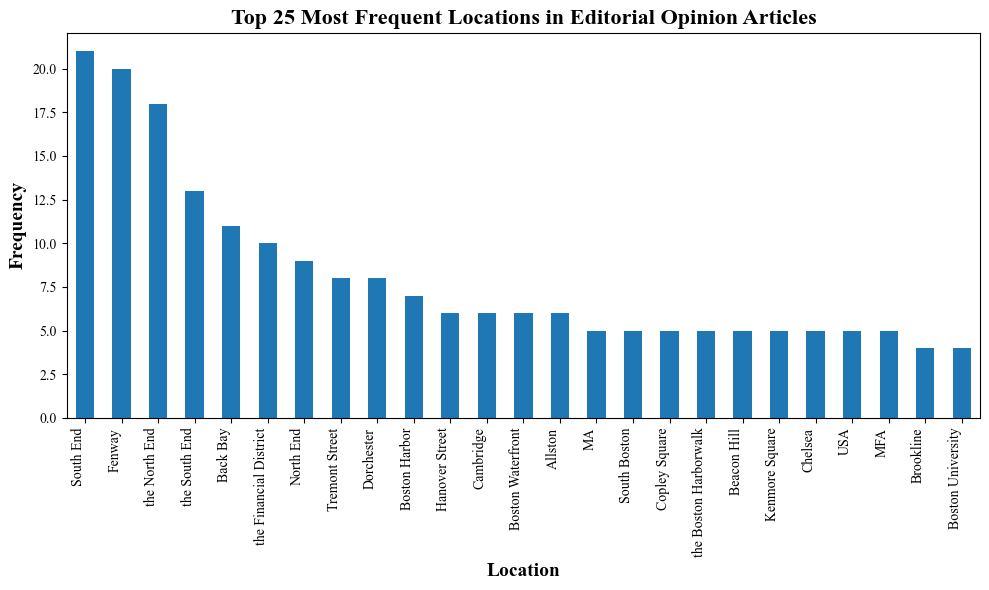

In [118]:
import pandas as pd
import matplotlib.pyplot as plt
import ast

# Filter the DataFrame to include only rows with 'position_section' as 'EDITORIAL OPINION'
editorial_opinion_df = df[df['position_section'] == 'EDITORIAL OPINION']

# Extract locations mentioned in the 'NER_Filtered' column
locations = editorial_opinion_df['NER_Filtered'].apply(lambda x: [item[0] for item in ast.literal_eval(x)] if pd.notna(x) else [])

# Flatten the list of locations
all_locations = [location for sublist in locations for location in sublist]

# Count the frequencies of each location
location_counts = pd.Series(all_locations).value_counts()

# Plotting the most frequent locations
plt.figure(figsize=(10, 6))
location_counts.head(25).plot(kind='bar')
plt.xlabel('Location', fontdict={'fontsize': 14, 'fontweight': 'bold', 'fontfamily': 'Times New Roman'})
plt.ylabel('Frequency', fontdict={'fontsize': 14, 'fontweight': 'bold', 'fontfamily': 'Times New Roman'})
plt.title('Top 25 Most Frequent Locations in Editorial Opinion Articles', fontdict={'fontsize': 16, 'fontweight': 'bold', 'fontfamily': 'Times New Roman'})
plt.xticks(rotation=90, ha='right', fontfamily='Times New Roman')
plt.yticks(fontfamily='Times New Roman')
plt.tight_layout()
plt.savefig('top25_location_edop', transparent = True)

# Show plot
plt.show()


cleaned locations

In [113]:
import pandas as pd
import ast

# Assuming editorial_opinion_df is already defined
# Define a function to clean up the locations

def clean_locations(locations):
    # Replace "North Ends" with "North End"
    cleaned_locations = [location.replace('North Ends', 'North End') for location in locations]
    # Remove duplicates that refer to the same location
    cleaned_locations = list(set(cleaned_locations))
    # Replace characters like '-' and '&' with spaces and strip whitespace
    cleaned_locations = [location.replace('-', ' ').replace('&', ' ').strip() for location in cleaned_locations]
    return cleaned_locations
 
# Apply the cleaning function to the list of locations
editorial_opinion_df['cleaned_locations'] = editorial_opinion_df['NER_Filtered'].apply(
    lambda x: clean_locations([item[0] for item in ast.literal_eval(x)]) if pd.notna(x) else []
)
copy_df = df
copy_df['cleaned_locations']=copy_df['NER_Filtered'].apply(lambda x: [item[0] for item in ast.literal_eval(x)] if pd.notna(x) else [])
copy_df['cleaned_locations']

/var/folders/s8/rgy10y8d1d1557kt1cjml2hh0000gn/T/ipykernel_5967/3764837151.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  editorial_opinion_df['cleaned_locations'] = editorial_opinion_df['NER_Filtered'].apply(


0                                                [Fenway]
1       [Harvard Avenue, Brighton Avenue, Allston, All...
2                                         [The North End]
3                                             [South End]
4                   [Fenway Park, Boston Red Sox, Fenway]
                              ...                        
1429    [Tremont Street, Boylston Street, the Boston P...
1430                                        [Beacon Hill]
1431                                          [South End]
1432                                            [Roxbury]
1433               [Dorchester Avenue, Savin Hill Avenue]
Name: cleaned_locations, Length: 1434, dtype: object

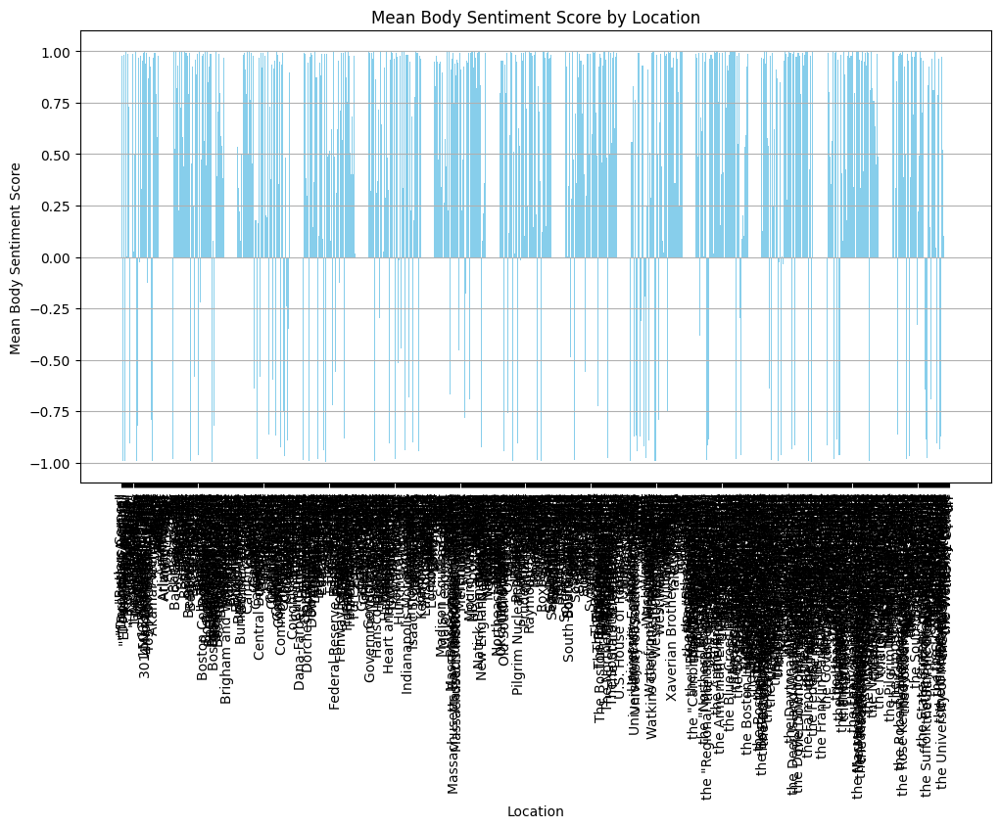

In [114]:
import pandas as pd
import matplotlib.pyplot as plt

# Explode the 'cleaned_locations' column to create a new row for each location in the list
exploded_df = df.explode('cleaned_locations')

# Group the exploded DataFrame by 'cleaned_locations' and calculate the mean sentiment score for each location
location_sentiment = exploded_df.groupby('cleaned_locations')['body_sentiment'].mean().reset_index()

# Plot a bar graph
plt.figure(figsize=(12, 6))
plt.bar(location_sentiment['cleaned_locations'], location_sentiment['body_sentiment'], color='skyblue')
plt.xlabel('Location')
plt.ylabel('Mean Body Sentiment Score')
plt.title('Mean Body Sentiment Score by Location')
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.show()


Wordcloud

/var/folders/s8/rgy10y8d1d1557kt1cjml2hh0000gn/T/ipykernel_5967/3804337491.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  editorial_opinion_df['cleaned_keywords'] = editorial_opinion_df['keywords'].apply(lambda x: remove_punctuation(x) if pd.notna(x) else '')
/var/folders/s8/rgy10y8d1d1557kt1cjml2hh0000gn/T/ipykernel_5967/3804337491.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  editorial_opinion_df['cleaned_locations'] = editorial_opinion_df['cleaned_locations'].apply(tuple)


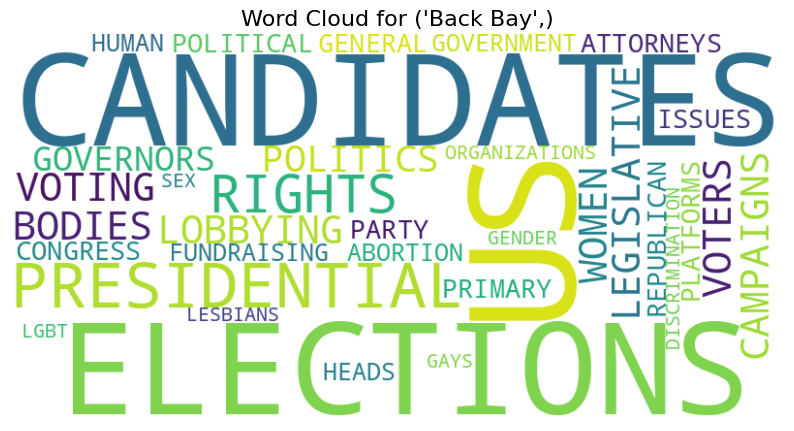

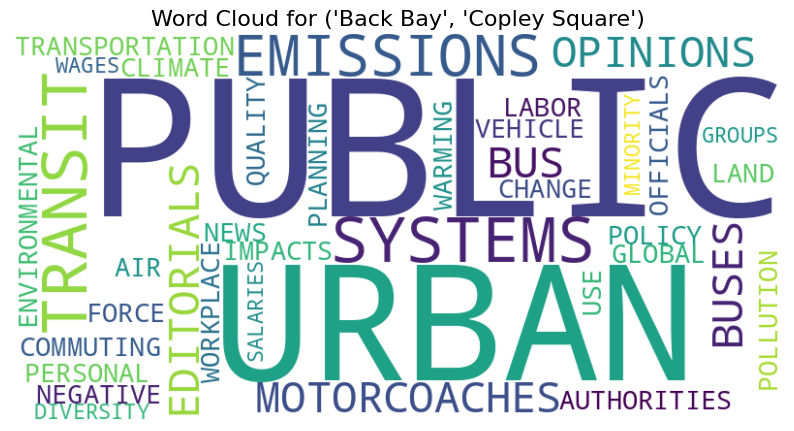

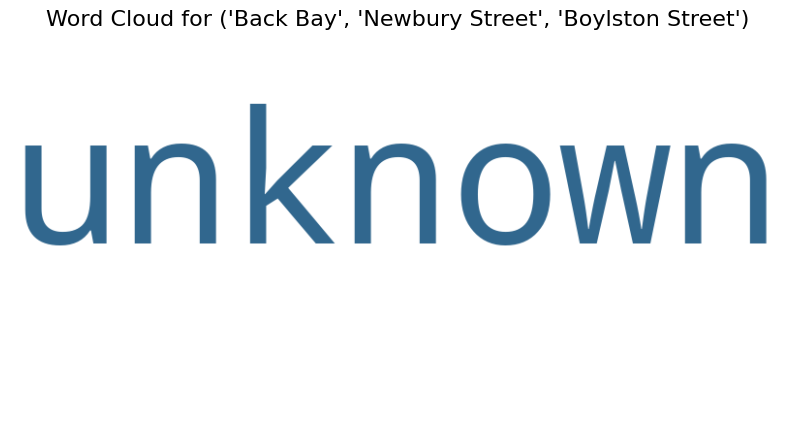

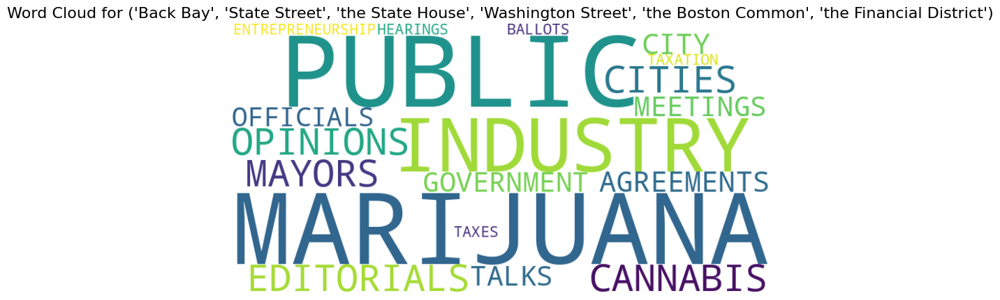

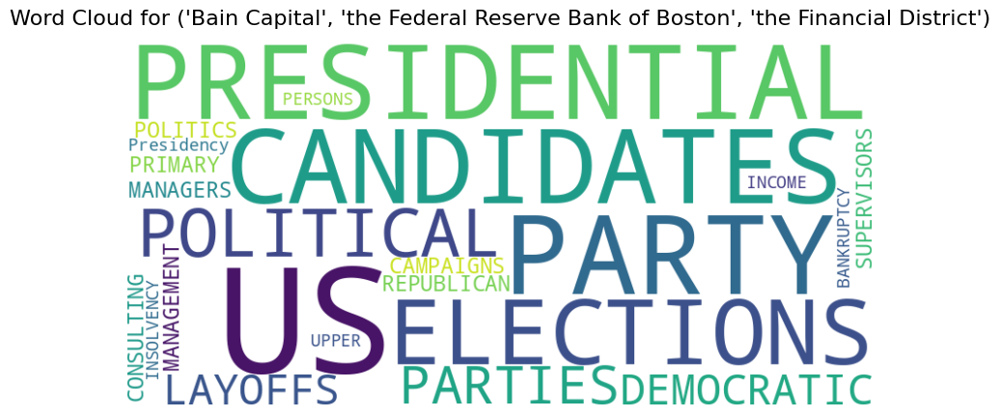

...

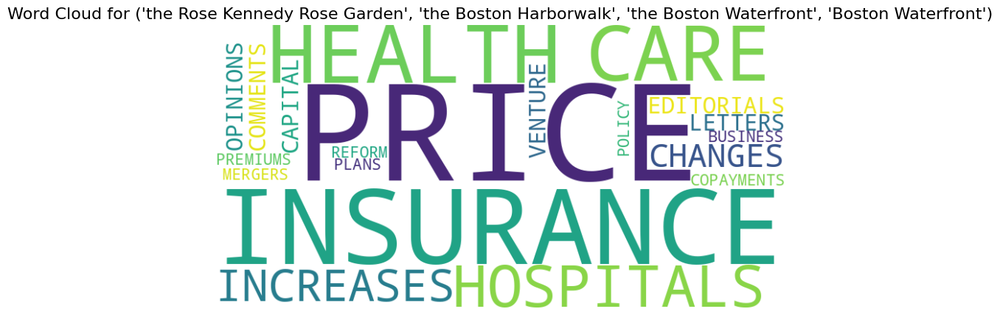

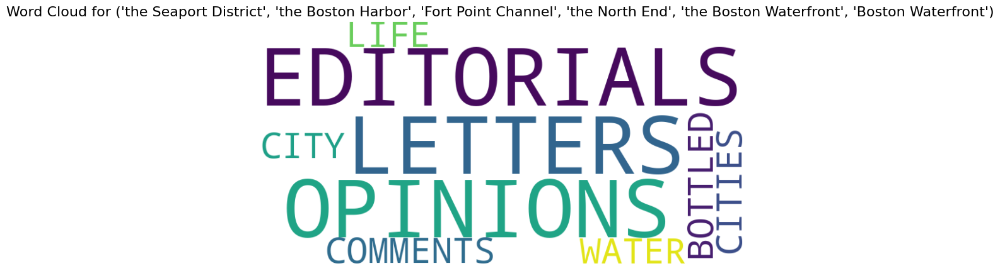

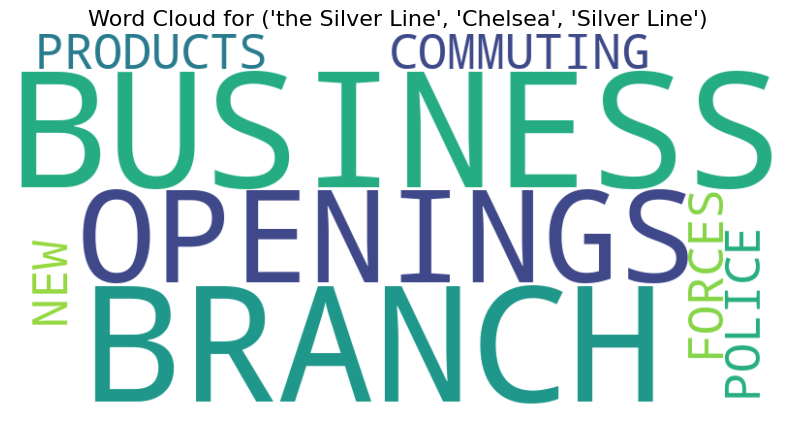

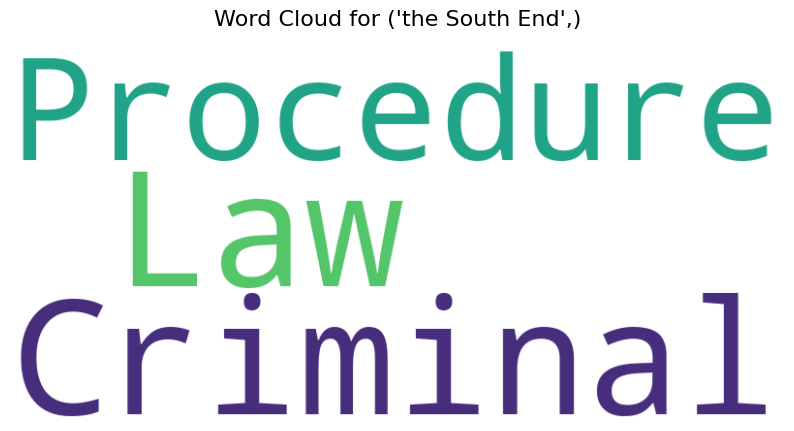

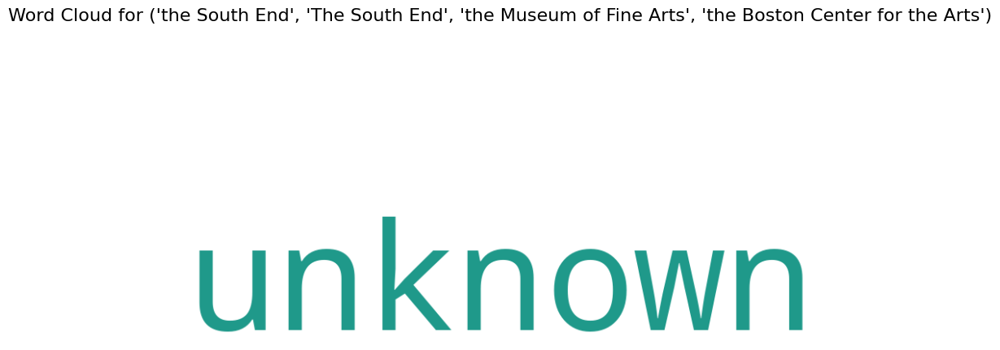

In [66]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import re

# Function to remove punctuation from a string
def remove_punctuation(text):
    return re.sub(r'[^\w\s]', '', text)

# Apply the function to each keyword string in the DataFrame
editorial_opinion_df['cleaned_keywords'] = editorial_opinion_df['keywords'].apply(lambda x: remove_punctuation(x) if pd.notna(x) else '')

# Convert lists in 'cleaned_locations' column to tuples
editorial_opinion_df['cleaned_locations'] = editorial_opinion_df['cleaned_locations'].apply(tuple)

# Group the DataFrame by unique locations
grouped_df = editorial_opinion_df.groupby('cleaned_locations')

# Iterate over each unique location
for location, location_df in grouped_df:
    # Combine the keywords of articles corresponding to the location
    all_keywords = ' '.join(location_df['cleaned_keywords']).split()
    
    # Generate a word cloud for the combined keywords
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(all_keywords))
    
    # Plot the word cloud
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {location}', fontsize=16)
    plt.axis('off')
    plt.show()
